In [ ]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 150
import matplotlib.pyplot as plt
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [ ]:
!pip install geneticalgorithm

In [ ]:
from geneticalgorithm import geneticalgorithm as ga

In [ ]:
pip install pyswarms

In [ ]:
import numpy as np
from mpl_toolkits.mplot3d import Axes3D

## Another Example of a Non-Convex objective function

In [ ]:
def objective(X):
    x1 = X[0]
    x2 = X[1]
    obj = 0.2 + x1**2 + x2**2 - 0.1*np.cos(6.0*3.1415*x1) - 0.1*np.cos(6.0*3.1415*x2)
    return obj

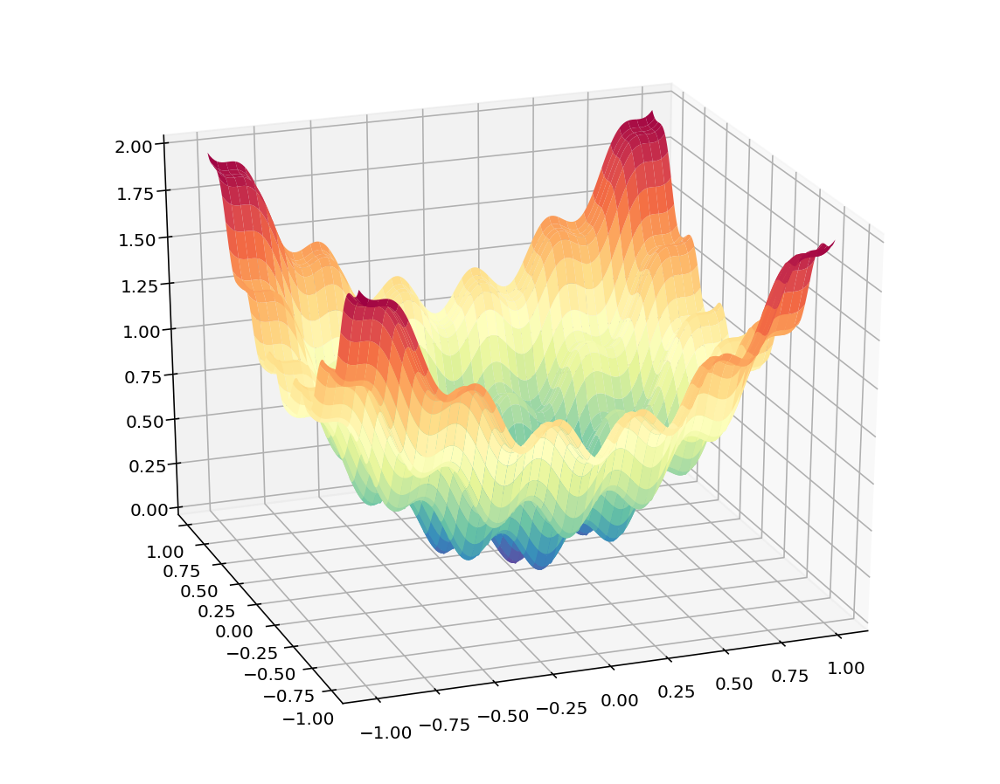

In [ ]:
# define range for input
r_min, r_max = -1.0, 1.0
# sample input range uniformly at 0.1 increments
xaxis = np.arange(r_min, r_max, 0.01)
yaxis = np.arange(r_min, r_max, 0.01)
# create a mesh from the axis
X = np.meshgrid(xaxis, yaxis)
# compute targets
results = objective(X)
# create a surface plot with the jet color scheme
figure = plt.figure(figsize=(10,8))
axis = figure.gca(projection='3d')
axis.plot_surface(X[0], X[1], results, cmap='Spectral_r')
axis.view_init(25,250)
# show the plot
plt.show()

In [ ]:
import plotly.graph_objs as go

fig = go.Figure(data=[go.Surface(z=results, x=X[0], y=X[1],colorscale='Jet')])
fig.update_layout(title='Non-Convex Surface', autosize=True,
        scene = {
            "xaxis": {"nticks": 20},
            "zaxis": {"nticks": 4},
            'camera_eye': {"x": 0, "y": -1, "z": 0.5},
            "aspectratio": {"x": 1, "y": 1, "z": 0.75}})
fig.show()

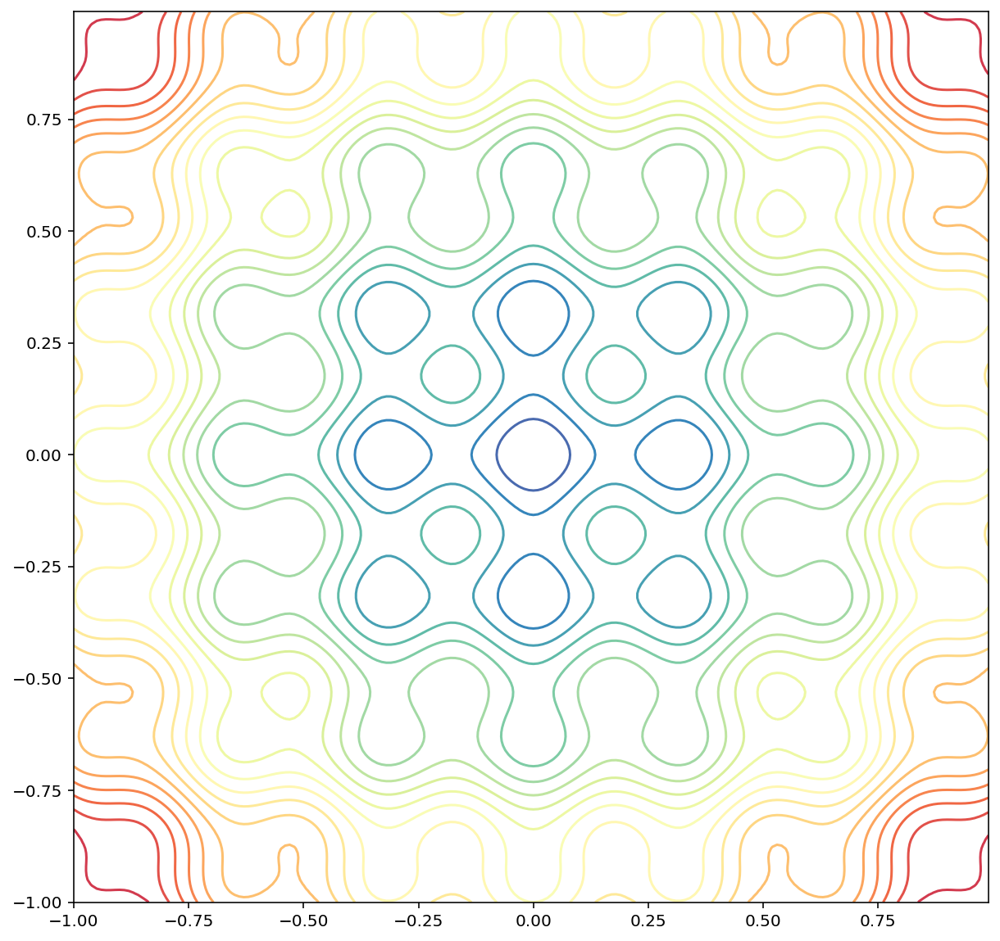

In [ ]:
figure = plt.figure(figsize=(10,10))
plt.contour(X[0], X[1], results, 20, alpha=1.0, cmap='Spectral_r')
plt.show()

Text(0, 0.5, 'x2')

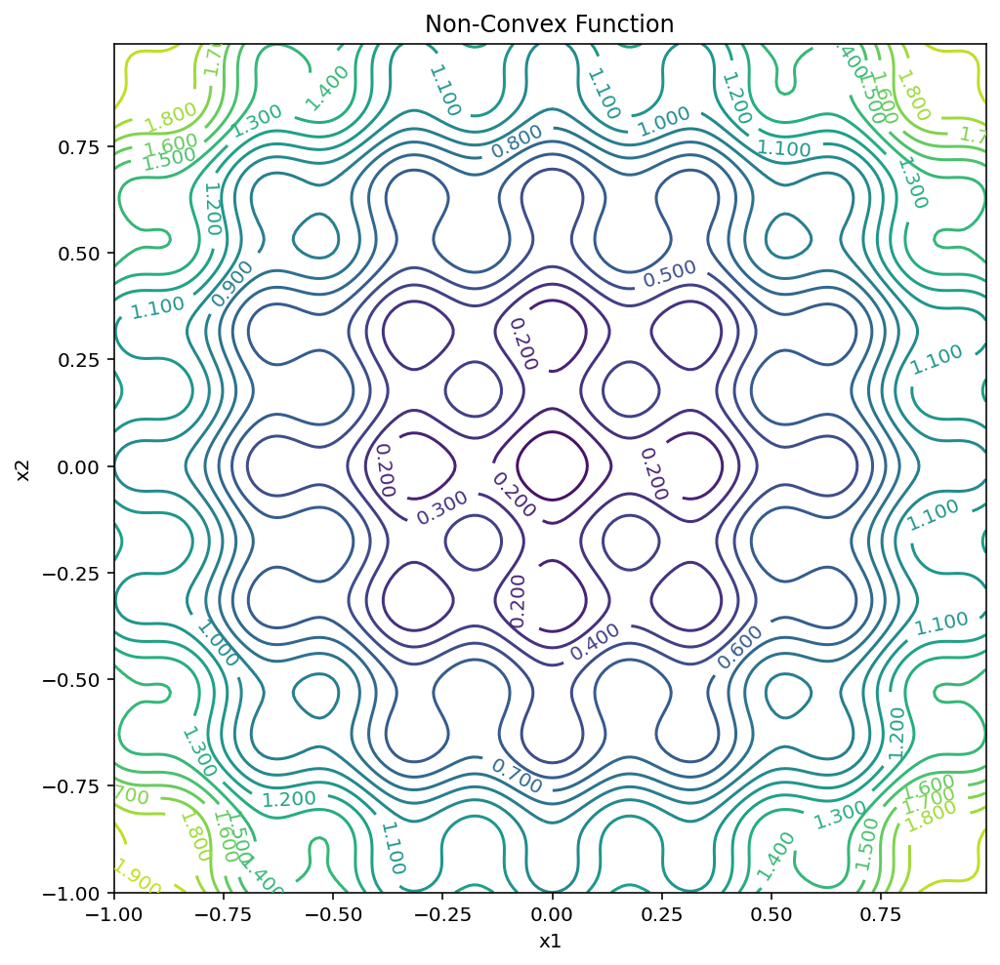

In [ ]:
# Create a contour plot
plt.figure(figsize=(8,8))
# Specify contour lines
#lines = range(2,52,2)
# Plot contours
CS = plt.contour(X[0], X[1], results,20)#,lines)
# Label contours
plt.clabel(CS, inline=1, fontsize=10)
# Add some text to the plot
plt.title('Non-Convex Function')
plt.xlabel('x1')
plt.ylabel('x2')

In [ ]:
# Import modules
import matplotlib
matplotlib.rcParams['animation.embed_limit'] = 2**128
from IPython.display import Image
from IPython.display import HTML, display
import pyswarms as ps

In [ ]:
# instantiate the optimizer
max = np.array([1,1])
min = np.array([-1,-1])
bounds = (min, max)
options = {'c1': 0.25, 'c2': 0.5, 'w': 0.5}
optimizer = ps.single.GlobalBestPSO(n_particles=20, dimensions=2, options=options, bounds=bounds)

In [ ]:
def objective_pso(X):
    x1 = X[:,0]
    x2 = X[:,1]
    obj = 0.2 + x1**2 + x2**2 - 0.1*np.cos(6.0*3.1415*x1) - 0.1*np.cos(6.0*3.1415*x2)
    return obj

In [ ]:
cost, pos = optimizer.optimize(objective_pso, iters=100)

2022-04-04 02:01:25,118 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.25, 'c2': 0.5, 'w': 0.5}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=0.105
2022-04-04 02:01:25,821 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.1051417645406523, best pos: [-7.13804873e-11  3.15248143e-01]


In [ ]:
pos

array([-7.13804873e-11,  3.15248143e-01])

## The application of the Genetic Algorithm on the same objective

> Indented block



 The best solution found:
 [-0.00117045 -0.00017247]

 Objective function:
 2.6263206584609122e-05


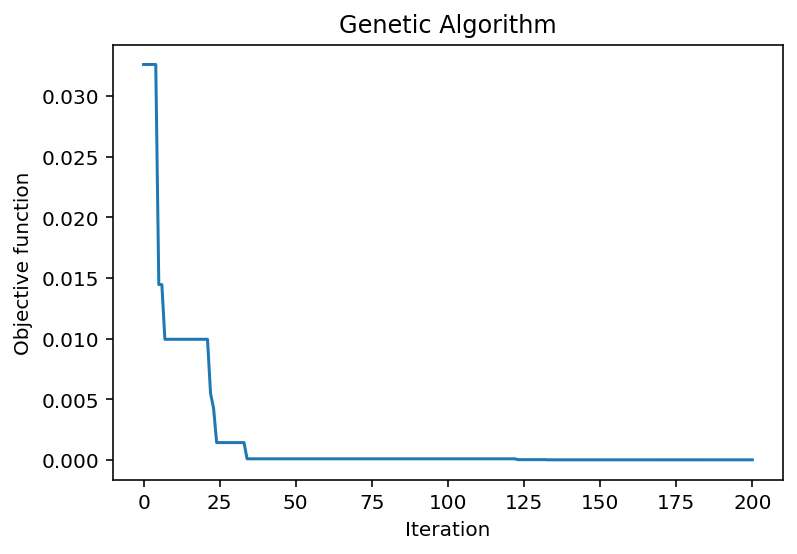

In [ ]:
varbound=np.array([[-1,1]]*2)

model=ga(function=objective,dimension=2,variable_type='real',variable_boundaries=varbound)

model.run()

## Application with Simulated Annealing

In [ ]:
from scipy.optimize import dual_annealing

In [ ]:
lw = [-1] * 2
up = [1] * 2
ret = dual_annealing(objective, bounds=list(zip(lw, up)))

In [ ]:
ret.x

array([-3.90588793e-09, -5.01518370e-09])

##Application of PSO to the Himmelblau's function

In [ ]:
# instantiate the optimizer
max = np.array([6,6])
min = np.array([-6,-6])
bounds = (min, max)
options = {'c1': 0.25, 'c2': 0.5, 'w': 0.5}
optimizer = ps.single.GlobalBestPSO(n_particles=20, dimensions=2, options=options, bounds=bounds)

In [ ]:
# objective function with column vectors for the format wanted by the PSO algorithm
def objective2(X):
	return (X[:,0]**2 + X[:,1] - 11)**2 + (X[:,0] + X[:,1]**2 -7)**2

In [ ]:
cost, pos = optimizer.optimize(objective2, iters=100)

2021-11-02 12:54:34,101 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.25, 'c2': 0.5, 'w': 0.5}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=1.16e-27
2021-11-02 12:54:34,301 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 1.1643586961062134e-27, best pos: [3. 2.]


In [ ]:
# Initialize mesher with the function
m = Mesher(func=objective2,delta=0.01,limits=[(-6,6),(-6,6)])

In [ ]:
%%capture
# Make animation
animation = plot_contour(pos_history=optimizer.pos_history,mesher=m,mark=(2,3),designer=Designer(limits=[(-6,6), (-6,6)], label=['x-axis', 'y-axis']))

In [ ]:
HTML(animation.to_html5_video())

2021-11-02 12:57:18,124 - matplotlib.animation - INFO - Animation.save using <class 'matplotlib.animation.FFMpegWriter'>
2021-11-02 12:57:18,127 - matplotlib.animation - INFO - MovieWriter._run: running command: ffmpeg -f rawvideo -vcodec rawvideo -s 720x576 -pix_fmt rgba -r 12.5 -loglevel error -i pipe: -vcodec h264 -pix_fmt yuv420p -y /tmp/tmpl4xqa3qf/temp.m4v


## Particle Swarms Optimization application to the first objective function

In [ ]:
# Import modules
import matplotlib
matplotlib.rcParams['animation.embed_limit'] = 2**128
from IPython.display import Image
from IPython.display import HTML, display
import pyswarms as ps

In [ ]:
from pyswarms.utils.functions import single_obj as fx
from pyswarms.utils.plotters import (plot_cost_history, plot_contour, plot_surface)
from pyswarms.utils.plotters.formatters import Mesher
from pyswarms.utils.plotters.formatters import Designer

In [ ]:
# objective function
def objective1(X):
	return -2*np.exp(-((X[:,0]-1.0)**2+X[:,1]**2)/.2)-3*np.exp(-((X[:,0]+1.0)**2+X[:,1]**2)/.2) + X[:,0]**2+X[:,1]**2

In [ ]:
# instantiate the optimizer
max = np.array([2,2])
min = np.array([-2,-2])
bounds = (min, max)
options = {'c1': 0.25, 'c2': 0.5, 'w': 0.5}
optimizer = ps.single.GlobalBestPSO(n_particles=20, dimensions=2, options=options, bounds=bounds)

# now run the optimization, pass a=1 and b=100 as a tuple assigned to args

cost, pos = optimizer.optimize(objective1, iters=100)

2021-11-02 12:42:07,032 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.25, 'c2': 0.5, 'w': 0.5}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=-2.06
2021-11-02 12:42:07,277 - pyswarms.single.global_best - INFO - Optimization finished | best cost: -2.0630902517681946, best pos: [-9.36300635e-01  2.63146792e-09]


In [ ]:
# Initialize mesher with the function
m = Mesher(func=objective1,delta=0.01,limits=[(-2,2),(-2,2)])

In [ ]:
%%capture
# Make animation
animation = plot_contour(pos_history=optimizer.pos_history,mesher=m,mark=(-1,0),designer=Designer(limits=[(-2,2), (-2,2)], label=['x-axis', 'y-axis']))

In [ ]:
HTML(animation.to_html5_video())

2021-11-02 12:43:01,543 - matplotlib.animation - INFO - Animation.save using <class 'matplotlib.animation.FFMpegWriter'>
2021-11-02 12:43:01,546 - matplotlib.animation - INFO - MovieWriter._run: running command: ffmpeg -f rawvideo -vcodec rawvideo -s 720x576 -pix_fmt rgba -r 12.5 -loglevel error -i pipe: -vcodec h264 -pix_fmt yuv420p -y /tmp/tmpj4cvfte1/temp.m4v


2021-11-01 21:08:41,147 - matplotlib.animation - INFO - Animation.save using <class 'matplotlib.animation.PillowWriter'>


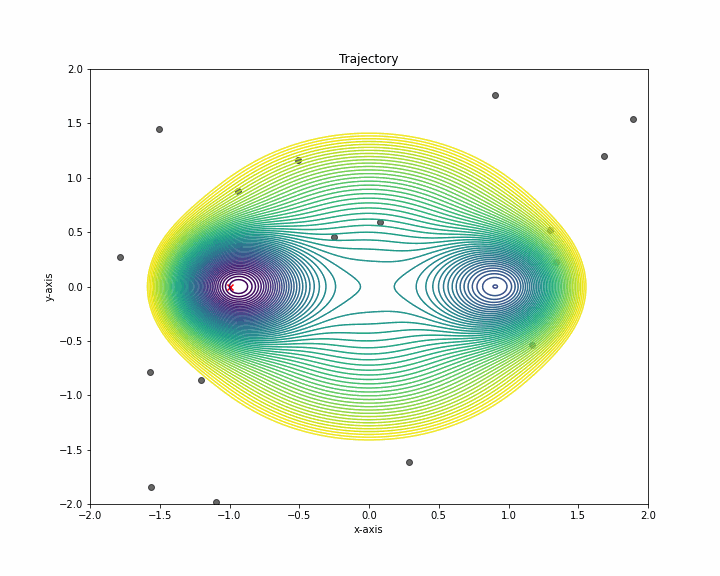

In [ ]:
# Enables us to view it in a Jupyter notebook
animation.save('result2D.gif', writer='pillow', fps=15)
Image(open('result2D.gif','rb').read())

## The Application of the Genetic Algorithm

In [ ]:
pip install geneticalgorithm

     |████████████████████████████████| 44 kB 1.0 MB/s 
  Created wheel for func-timeout: filename=func_timeout-4.3.5-py3-none-any.whl size=15095 sha256=c5d86178daca4544b69d61f3283105ce022435f4cf620998d29767e90a7d3c73
  Stored in directory: /root/.cache/pip/wheels/68/b5/a5/67c4364c354e141f5a1bd3ec568126f77877ab7554cf5af8cb
Successfully built func-timeout


In [ ]:
from geneticalgorithm import geneticalgorithm as ga

In [ ]:
# objective function
def objective1(X):
	alpha = X[0]
	L1_ratio = X[1]
	return -2*np.exp(-((X[0]-1.0)**2+X[1]**2)/.2)-3*np.exp(-((X[0]+1.0)**2+X[1]**2)/.2) + X[0]**2+X[1]**2

 The best solution found:
 [-9.36353463e-01  2.12581084e-04]

 Objective function:
 -2.0630895001581018


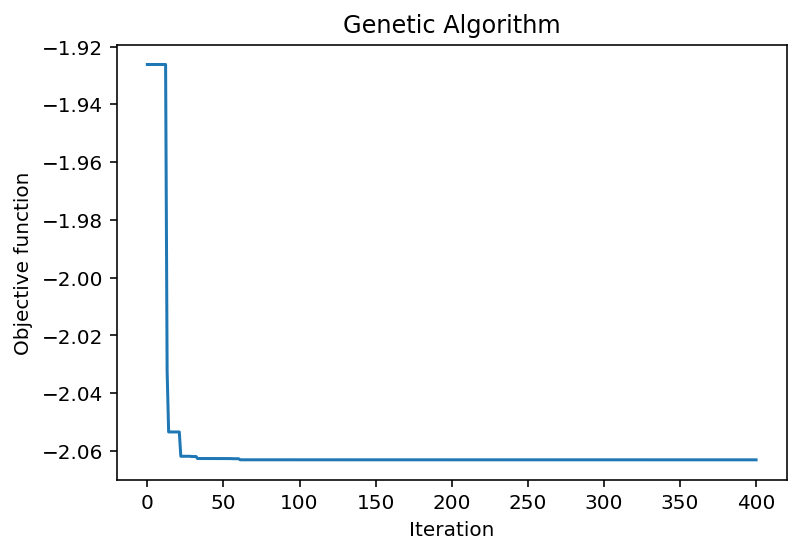

In [ ]:
varbound=np.array([[-2,2]]*2)

model=ga(function=objective1,dimension=2,variable_type='real',variable_boundaries=varbound)

model.run()